# Project: Advanced Lane Finding

**Author : Mouad HADJI, January 6th, 2018.**

In this project, my main objective is to take a video feed from an onboard camera and identify the lane lines and the curvature of the road.

For this purpose, I will aim at achieving the following steps :

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## 1. Import packages

In [1]:
import os
import sys
import glob
import pickle
import cv2
import random
from scipy import ndimage
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque
from moviepy.editor import VideoFileClip
%matplotlib inline

## 2. Load The Data

We define here all the useful paths that we will use to import or export data during this project

In [2]:
project_path = os.path.join(os.environ['HOME'], "sdcnd/advanced_lane_finding")
test_path = os.path.join(project_path, "test_images")
camera_path = os.path.join(project_path, "camera_cal")
output_path = os.path.join(project_path, "output_images")

In [3]:
test_images_name = [os.path.join(test_path, imname) for imname in os.listdir(test_path) if 'test' in imname]
stght_images_name = [os.path.join(test_path, imname) for imname in os.listdir(test_path) if 'straight_line' in imname]

test_images = [cv2.imread(full_imname) for full_imname in test_images_name]
stght_images = [cv2.imread(full_imname) for full_imname in stght_images_name]

test_images_dis = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB) for image in test_images]
stght_images_dis = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB) for image in stght_images]

## 3. Visualization functions

In [4]:
def show_images(images, n_row=1, n_col=2, figsize=(15, 10), cmap=None, save=False, filename=''):

    fig, ax = plt.subplots(n_row, n_col, figsize=figsize)
    n_images = n_row*n_col
    images = images[:n_images]
    
    for i, image in enumerate(images):
        plt.subplot(n_row, n_col, i+1)
        plt.imshow(image) if cmap is None else plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])   
    if save:
        plt.savefig(os.path.join(output_path, filename + '.png'))
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

In [5]:
def compare_images(two_images, two_labels):
    fig, axes = plt.subplots(ncols=2, figsize=(20, 10))
    axes[0].imshow(two_images[0])
    axes[0].set_title(two_labels[0])
    axes[1].imshow(two_images[1])
    axes[1].set_title(two_labels[1])

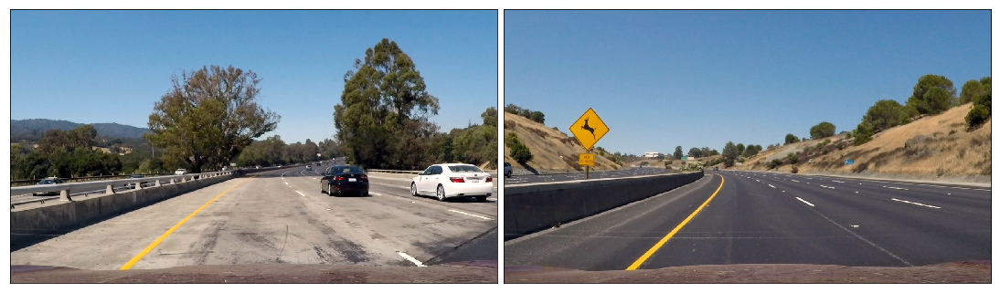

In [6]:
show_images(test_images_dis)

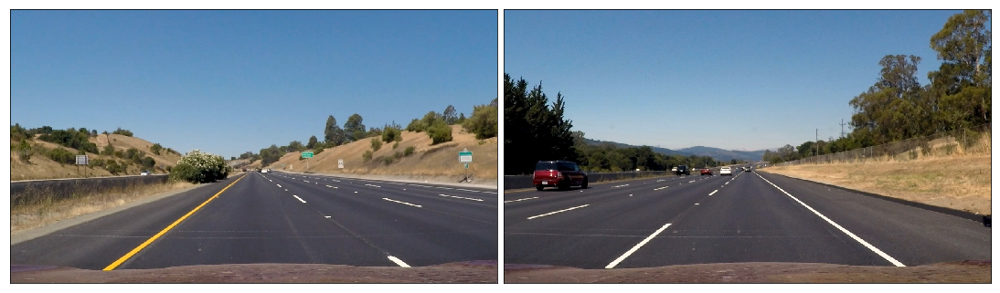

In [7]:
show_images(stght_images_dis)

## 4. Camera Calibration and Distortion Correction

#### Objectives : 
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.

In [8]:
class CameraCalibration():

    
    def __init__(self, camera_path):
        self.camera_path = camera_path
        self.nx = 9
        self.ny = 6
        self.objpoints = [] # 3D points in real space
        self.imgpoints = [] # 2D points in image picture
        self.objp = np.zeros((self.ny*self.nx,3), np.float32) # Prepare object points
        self.objp[:,:2] = np.mgrid[0:self.nx,0:self.ny].T.reshape(-1,2) # x and y cordinates.
        self.old_images = []
        self.new_images = []
        # calibrate
        self.run()
        
        
    def load_images(self):
        '''
        Load calibration images from class camera path
        '''
        camera_cal_list = [os.path.join(self.camera_path, imname) for imname in os.listdir(self.camera_path)]
        camera_cal_img = [cv2.imread(full_imname) for full_imname in camera_cal_list]
        return camera_cal_img


    
    def find_corners(self, img):
        '''
        Inputs
        img: input chessboard image
        ---
        Returns
        matrix of corners if there were corners
        '''
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (self.nx, self.ny), None)
        if ret == True:
            return corners
        
    def run(self):
        '''
        Load images, find corners and store them for calibration images
        '''
        # load all images
        camera_cal_img = self.load_images()
        # find corners in images
        camera_cal_corners = [self.find_corners(img) for img in camera_cal_img]
        
        for img, corners in zip(camera_cal_img, camera_cal_corners):
            if corners is not None:
                self.imgpoints.append(corners)
                self.objpoints.append(self.objp)
                
                new_image = cv2.drawChessboardCorners(img.copy(), (9,6), corners, True)
                
                self.old_images.append(img)
                self.new_images.append(new_image)
        
        ## camera calibration given all object points and image points
        img_shape = self.old_images[0].shape
        self.ret, self.mtx, self.dist, self.rvecs, self.tvecs = cv2.calibrateCamera(self.objpoints, self.imgpoints, img_shape[0:2], None, None)
        
        # undistorted images
        self.undist_images = [self.undistort(img) for img in self.old_images]

        
    def undistort(self, img):
        '''
        Inputs
        img: distorted image
        ---
        Returns
        undistorted image using class calibration attributes
        '''
        undist = cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
        return undist

In [9]:
CC = CameraCalibration(camera_path)

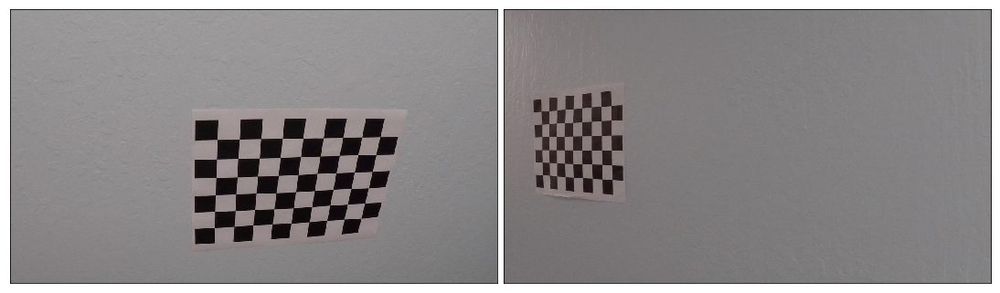

In [10]:
show_images(CC.old_images)

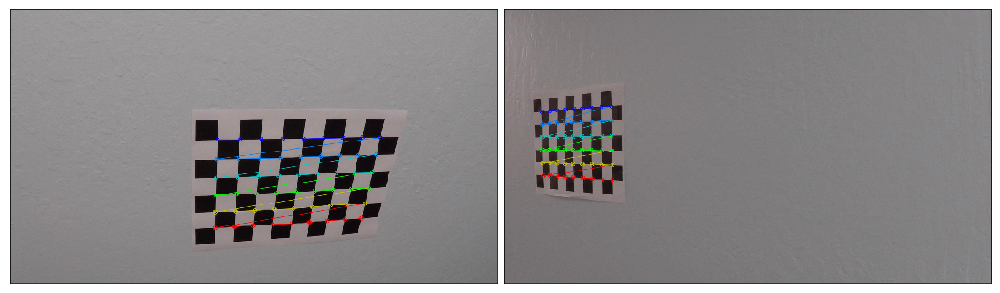

In [11]:
show_images(CC.new_images)

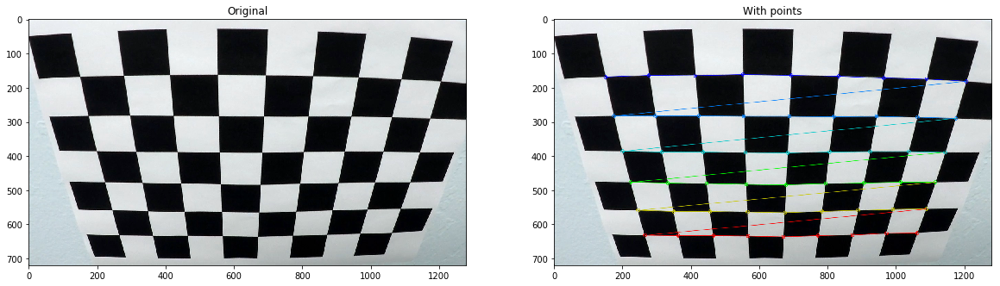

In [12]:
compare_images([CC.old_images[10], CC.new_images[10]], ['Original', 'With points'])

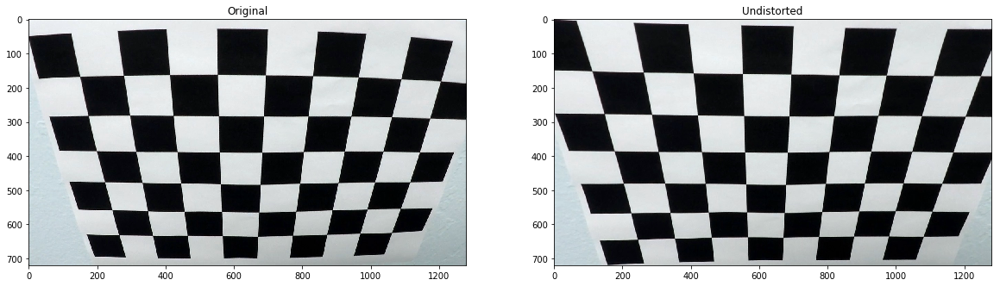

In [13]:
compare_images([CC.old_images[10], CC.undist_images[10]], ['Original', 'Undistorted'])

#### Undistort images

In [14]:
test_images_undist = [CC.undistort(image) for image in test_images_dis]
stght_images_undist = [CC.undistort(image) for image in stght_images_dis]

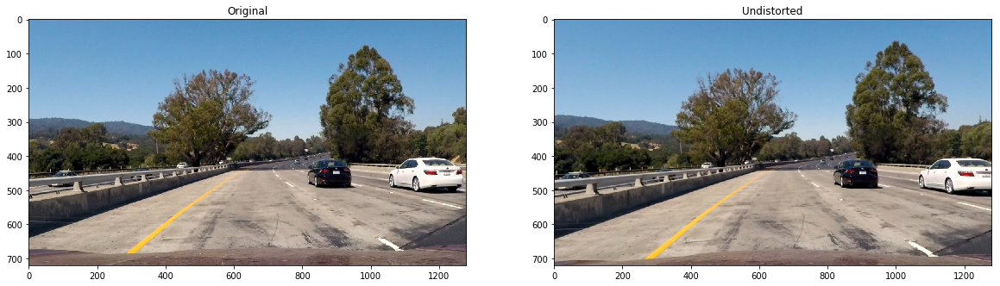

In [15]:
compare_images([test_images_dis[0], test_images_undist[0]], ['Original', 'Undistorted'])

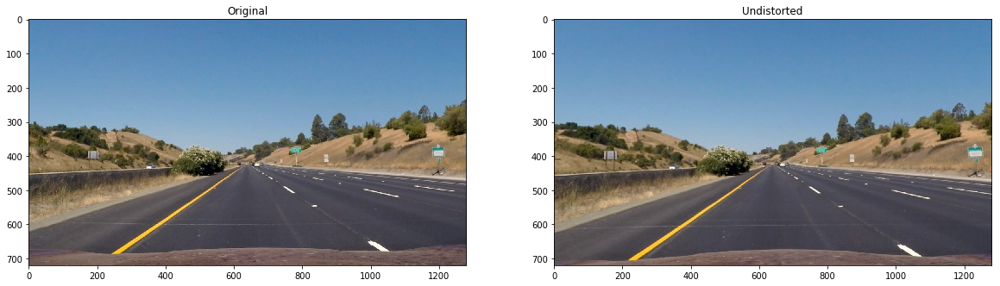

In [16]:
compare_images([stght_images_dis[0], stght_images_undist[0]], ['Original', 'Undistorted'])

In [17]:
sample_images = test_images_dis + stght_images_dis
sample_images_undist = test_images_undist + stght_images_undist

## 5. Color and Gradient Thresholding

#### Objectives : 
- Use color transforms, gradients, etc., to create a thresholded binary image.

In [18]:
class ImageProcessing():


    def extract_s_channel(self, img):
        # Convert to HLS color space and separate the S channel
        # Note: img is the undistorted image
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        return s_channel
        
   
    # Grayscale image
    def gray_scale(self, img):
        return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


    
    ## color selection for yellow and white, using the HLS and HSV color space
    def color_thresh(self, img, color_thresh_input=(90, 255), white_and_yellow_addon=True):

        ## convert to HLS color space and separate the S channel
        s_channel = self.extract_s_channel(img)
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= color_thresh_input[0]) & (s_channel <= color_thresh_input[1])] = 1
        
        if white_and_yellow_addon:
            ## convert to the HSV color space and select colors yellow and white
            hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            hls_image = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
            white_color = cv2.inRange(hls_image, np.uint8([10,200,0]), np.uint8([255,255,255]))
            yellow_color = cv2.inRange(hsv_image, np.uint8([15,60,130]), np.uint8([150,255,255]))

            combined_color_images = cv2.bitwise_or(white_color, yellow_color)

            ## combined binaries
            combined_binary = np.zeros_like(s_channel)
            combined_binary[(s_binary > 0) | (combined_color_images > 0)] = 1
        else:
            combined_binary = s_binary

        return combined_binary
 

        
    # use sobel thresholding to image
    # Note: img is a grayscaled image
    def abs_sobel_thresh(self, img, orient='x', sobel_kernel=3, sobel_thresh_input=(0,255)):
        
        thresh_min, thresh_max = sobel_thresh_input

        ## convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        ## take the derivative in x or y given orient = 'x' or 'y'
        if orient == 'x':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        elif orient == 'y':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        ## take the absolute value of the derivative or gradient
        abs_sobel = np.abs(sobel)

        # scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel)) 

        # create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

        return binary_output


    
    ## magnitude of gradient thresholding
    def magnitude_thresh(self, img, sobel_kernel=3, mag_thresh_input=(0, 255)):

        ## convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # take the gradient in x and y separately
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # calculate the magnitude 
        sobelxy_mag = np.sqrt(sobelx**2 + sobely**2)

        # scale to 8-bit (0 - 255) and convert to type = np.uint8
        sobelxy_scaled = np.uint8(255*sobelxy_mag/np.max(sobelxy_mag))

        # create a binary mask where mag thresholds are met
        binary_output = np.zeros_like(sobelxy_scaled)
        binary_output[(sobelxy_scaled >= mag_thresh_input[0]) & (sobelxy_scaled <= mag_thresh_input[1])] = 1

        return binary_output



    ## direction of gradient thresholding
    def direction_thresh(self, img, sobel_kernel=3, dir_thresh_input=(0, np.pi/2)):

        ## convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # take the gradient in x and y separately
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # take the absolute value of the x and y gradients
        abs_sobelx = np.abs(sobelx)
        abs_sobely = np.abs(sobely)

        # use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
        dir_grad = np.arctan2(abs_sobely, abs_sobelx)

        # create a binary mask where direction thresholds are met
        binary_output = np.zeros_like(dir_grad)
        binary_output[(dir_grad >= dir_thresh_input[0]) & (dir_grad <= dir_thresh_input[1])] = 1

        return binary_output


    
    ## combine gradient thresholds
    def combine_grad_thresh(self, img, sobel_kernel=3,
                            sobel_thresh_input=(0,255),
                            mag_thresh_input=(0,255),
                            dir_thresh_input=(0, np.pi/2),
                            mag_and_dir_addon=True
                           ):

        gradx = self.abs_sobel_thresh(img, orient='x', sobel_kernel=sobel_kernel, sobel_thresh_input=sobel_thresh_input)
        grady = self.abs_sobel_thresh(img, orient='y', sobel_kernel=sobel_kernel, sobel_thresh_input=sobel_thresh_input)
        
        combined = np.zeros_like(gradx)
        
        if mag_and_dir_addon:
            mag_binary = self.magnitude_thresh(img, sobel_kernel=sobel_kernel, mag_thresh_input=mag_thresh_input)
            dir_binary = self.direction_thresh(img, sobel_kernel=sobel_kernel, dir_thresh_input=dir_thresh_input)
            
            combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        else:
            
            combined[((gradx == 1) & (grady == 1))] = 1
        
        return combined


    
    def combine_grad_color(self, img,
                            sobel_kernel=3,
                            sobel_thresh_input=(10,160),
                            mag_thresh_input=(30, 100),
                            dir_thresh_input=(0.7, 1.3), 
                            color_thresh_input=(170, 255),
                            white_and_yellow_addon=True,
                            mag_and_dir_addon=True):
        img = cv2.fastNlMeansDenoisingColored(img,7,13,21,5)
        grad_binary = self.combine_grad_thresh(img,
                                               sobel_kernel=sobel_kernel, sobel_thresh_input=sobel_thresh_input,
                                               mag_thresh_input=mag_thresh_input, dir_thresh_input=dir_thresh_input,
                                              mag_and_dir_addon=mag_and_dir_addon)
        color_binary = self.color_thresh(img, color_thresh_input=color_thresh_input,
                                         white_and_yellow_addon=white_and_yellow_addon)
        grad_color_binary = np.zeros_like(color_binary)
        grad_color_binary[(color_binary == 1) | (grad_binary == 1)] = 1
        return grad_color_binary



    ## transform image
    def perspective_transform(self, img, src_points, dst_points):
        
        ## define image shape
        img_size = (img.shape[1], img.shape[0])

        ## define source and destination points
        src = np.array(src_points, np.float32)
        dst = np.array(dst_points, np.float32)
        
        ## perform transformation
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)

        warped = cv2.warpPerspective(img, self.M, img_size, flags=cv2.INTER_LINEAR)
        
        return warped, self.M, self.Minv

In [19]:
IP = ImageProcessing()

In [20]:
sample_s_channels = [IP.extract_s_channel(img) for img in sample_images_undist]

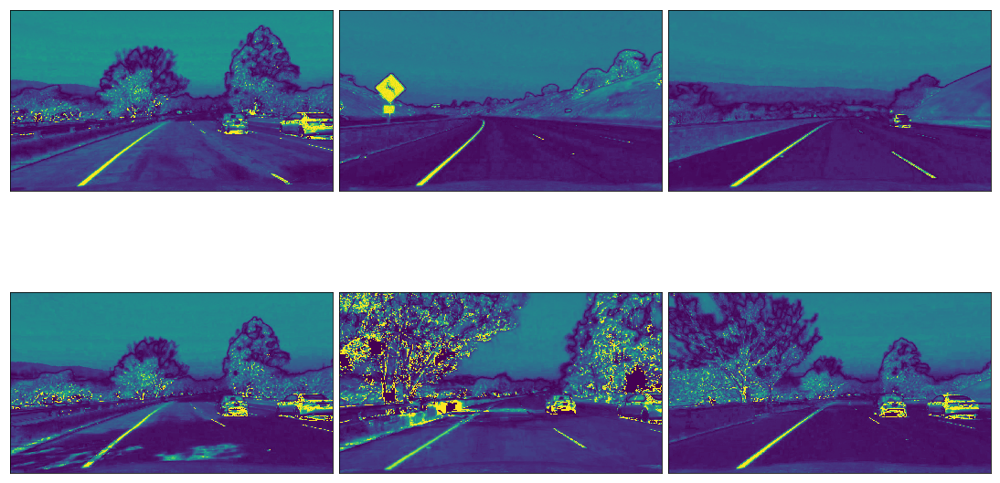

In [21]:
show_images(sample_s_channels, n_row=2, n_col=3)

In [22]:
gray_images = [IP.gray_scale(img) for img in sample_images_undist]

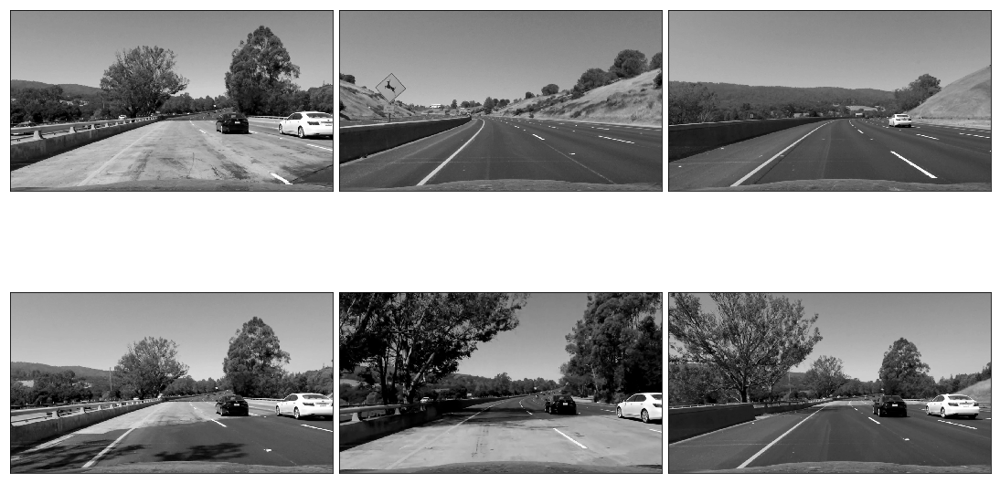

In [23]:
show_images(gray_images, n_row=2, n_col=3, cmap='gray')

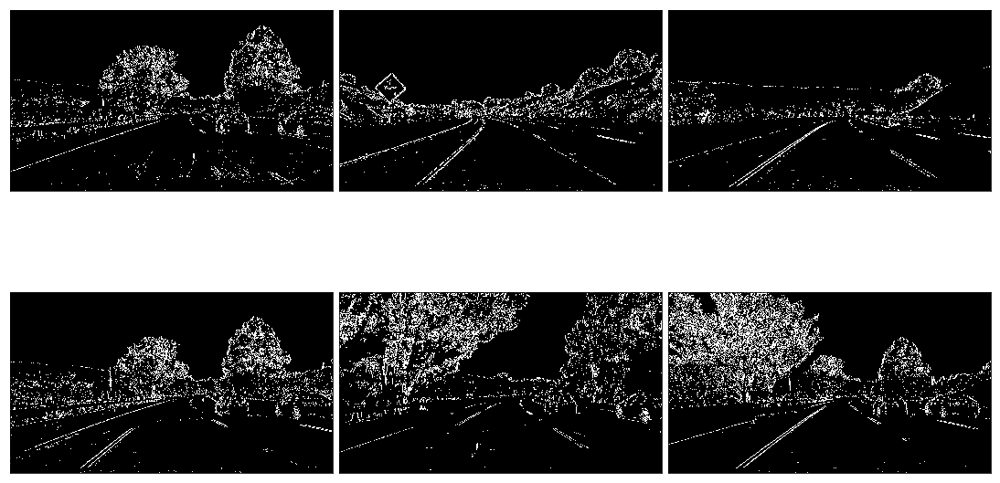

In [24]:
#### abs_sobel_thresh
sample_sobel_images = [IP.abs_sobel_thresh(img, orient='x', sobel_thresh_input=(20, 100)) for img in sample_images_undist]
show_images(sample_sobel_images, n_row=2, n_col=3, cmap='gray')

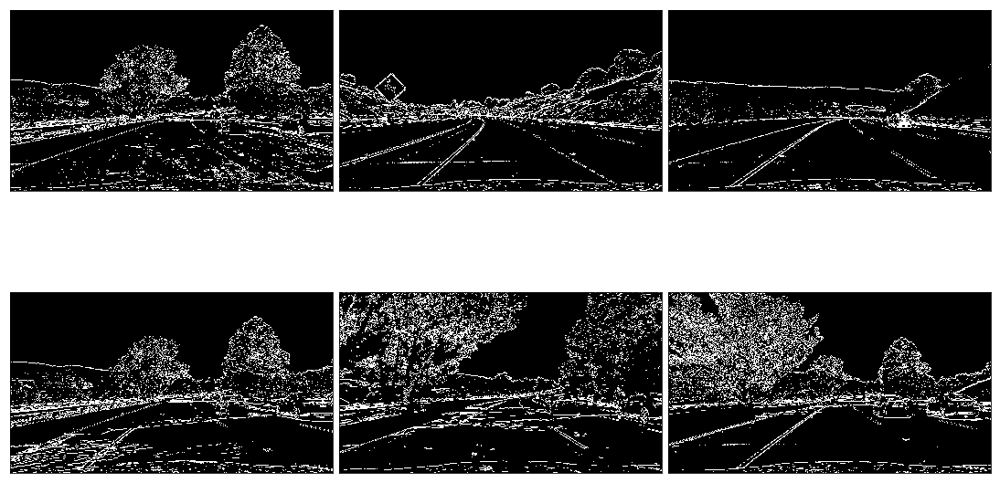

In [25]:
sample_sobel_images = [IP.abs_sobel_thresh(img, orient='y', sobel_thresh_input=(20, 100)) for img in sample_images_undist]
show_images(sample_sobel_images, n_row=2, n_col=3, cmap='gray')

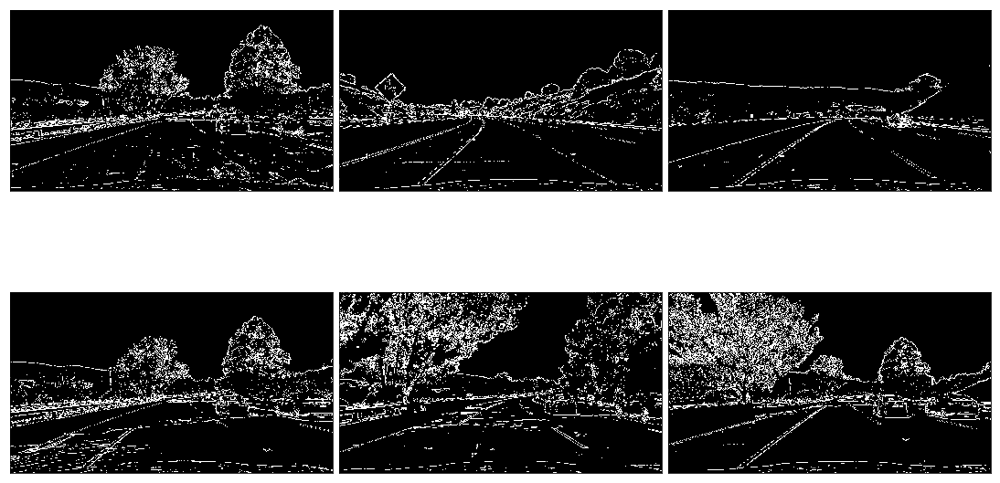

In [26]:
#### mag_thresh
sample_mag_images = [IP.magnitude_thresh(img, sobel_kernel=3, mag_thresh_input=(30, 100)) for img in sample_images_undist]
show_images(sample_mag_images, n_row=2, n_col=3, cmap='gray')

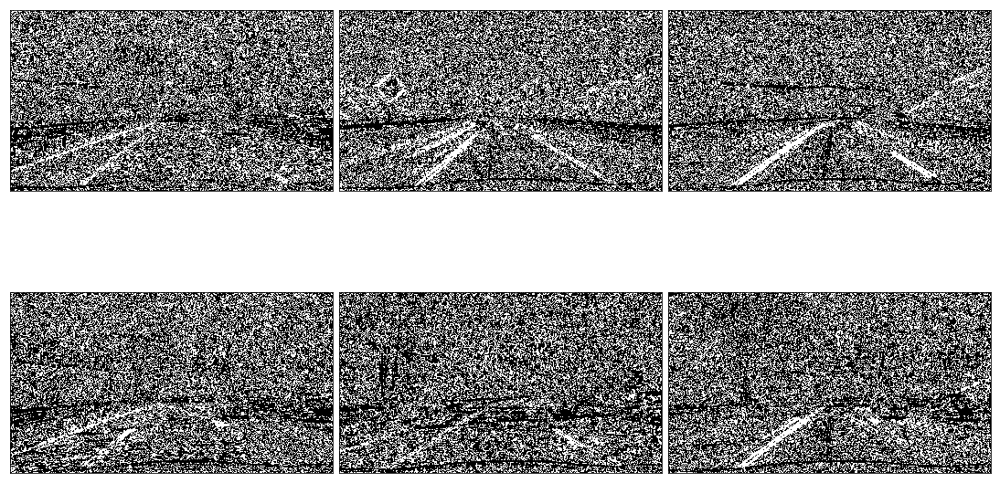

In [27]:
#### dir_threshold
sample_dir_images = [IP.direction_thresh(img, sobel_kernel=15, dir_thresh_input=(0.7, 1.3)) for img in sample_images_undist]
show_images(sample_dir_images, n_row=2, n_col=3, cmap='gray')

In [28]:
#### combining
sample_comb_images = [IP.combine_grad_thresh(img,
                                            sobel_kernel=15,
                                            sobel_thresh_input=(20,100),
                                            mag_thresh_input=(30, 100),
                                            dir_thresh_input=(0.7, 1.3),
                                            mag_and_dir_addon=False) for img in sample_images_undist]

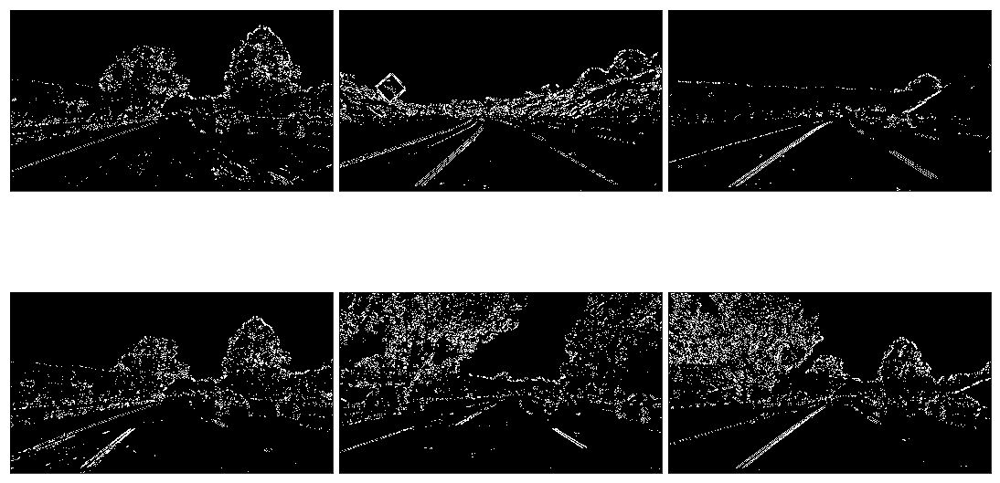

In [29]:
show_images(sample_comb_images, n_row=2, n_col=3, cmap='gray')

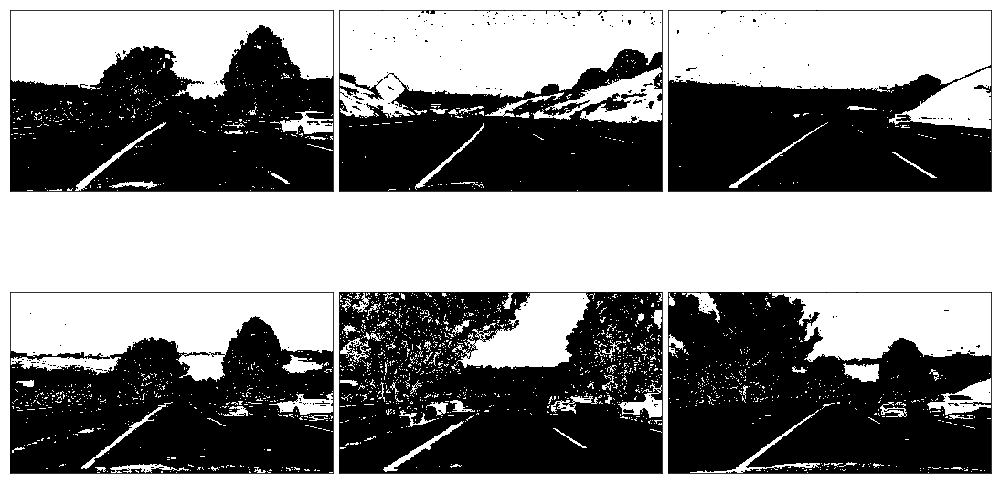

In [30]:
#### color threshold
sample_col_images = [IP.color_thresh(img, color_thresh_input=(170, 255), white_and_yellow_addon=True) for img in sample_images_undist]
show_images(sample_col_images, n_row=2, n_col=3, cmap='gray')

In [31]:
sample_combined_images = [IP.combine_grad_color(img) for img in sample_images_undist]

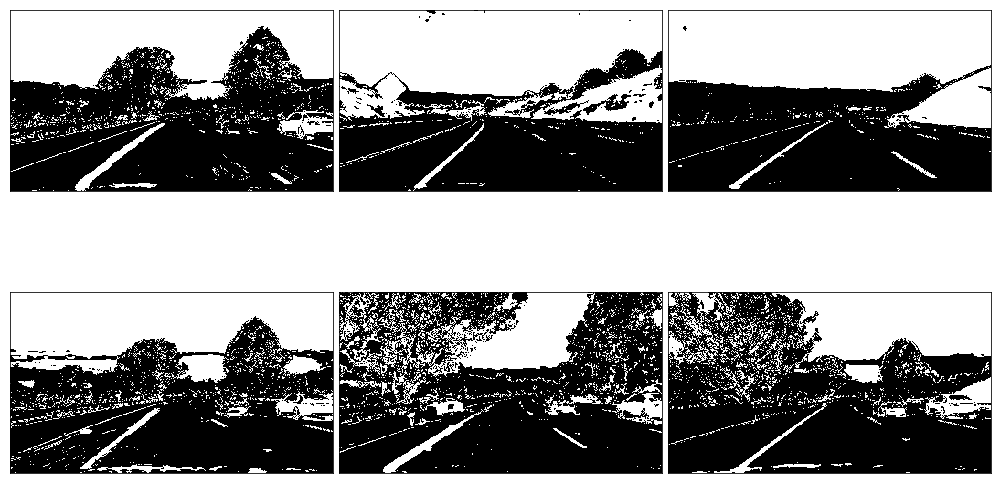

In [32]:
show_images(sample_combined_images, n_row=2, n_col=3, cmap='gray')

## 6. Perspective Transform

#### Objectives : 
- Apply a perspective transform to rectify binary image ("birds-eye view").

In [33]:
src_points = [[205, 720], [1120, 720], [745, 480], [550, 480]]
dst_points = [[205, 720], [1120, 720], [1120, 0], [205, 0]]

In [34]:
## transform image
def perspective_transform(img, src_points, dst_points):
    
    ## define image shape
    img_size = (img.shape[1], img.shape[0])

    ## define source and destination points
    src = np.array(src_points, np.float32)
    dst = np.array(dst_points, np.float32)
    
    ## perform transformation
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

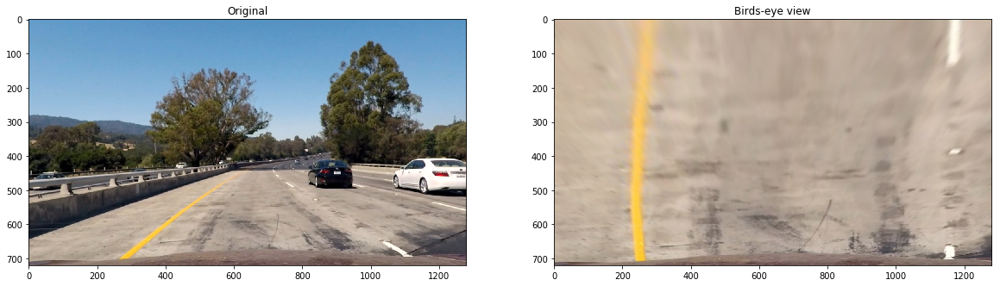

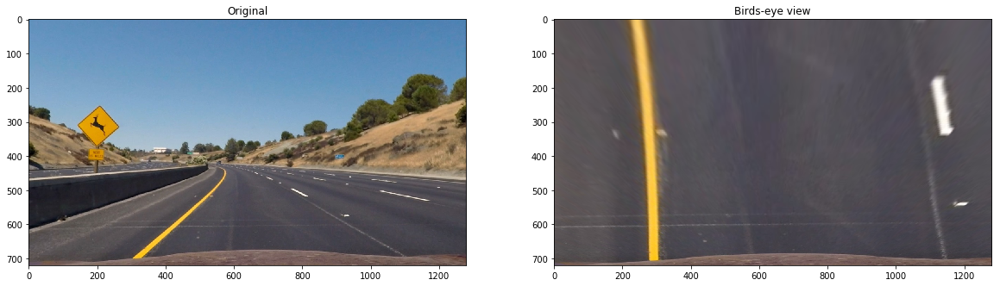

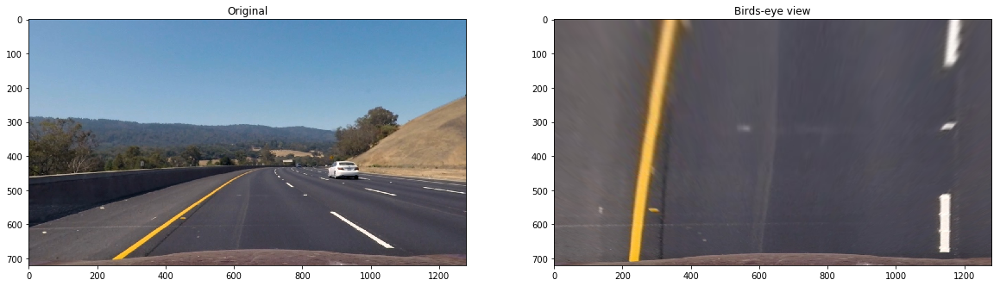

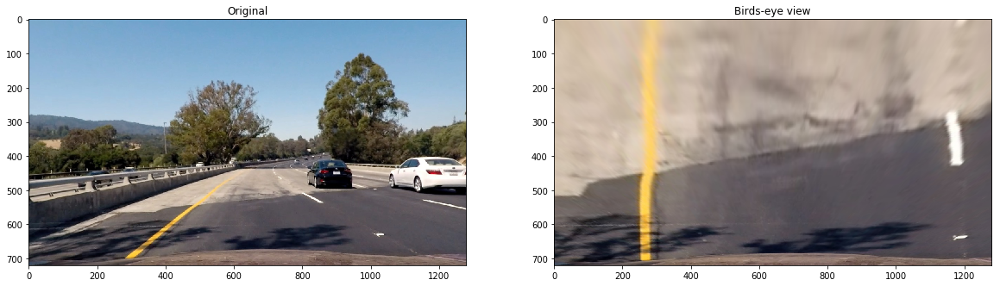

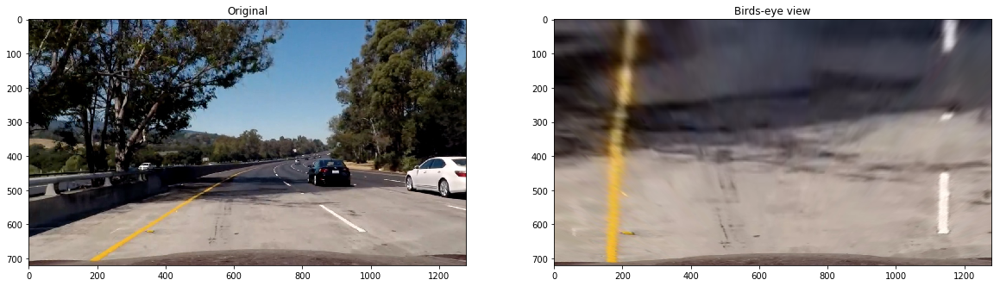

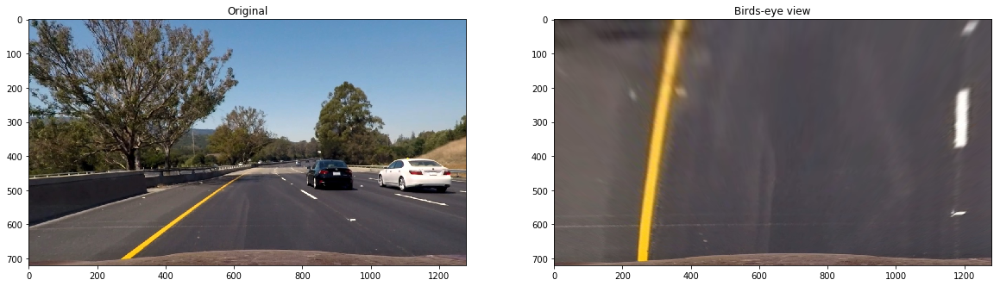

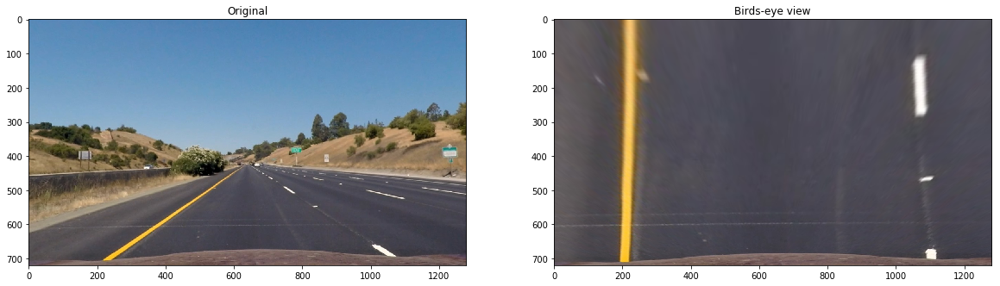

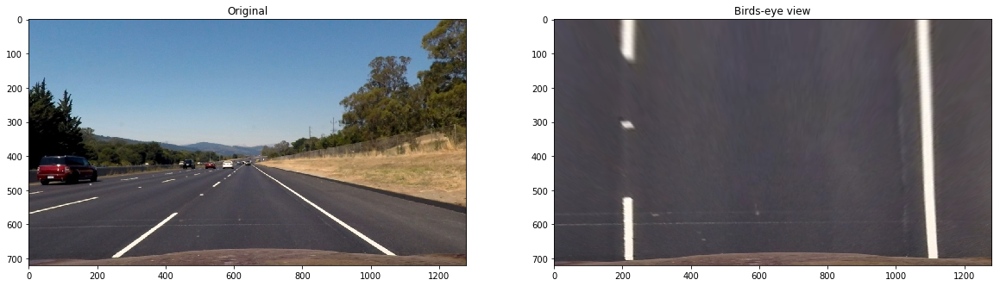

In [35]:
for idx in range(len(sample_images_undist)):
    original = sample_images_undist[idx]
    warped, M, Minv = perspective_transform(original, src_points, dst_points)
    compare_images([original, warped], ['Original', 'Birds-eye view'])

In [36]:
pipeline_test = [perspective_transform(img, src_points, dst_points)[0] for img in sample_combined_images]

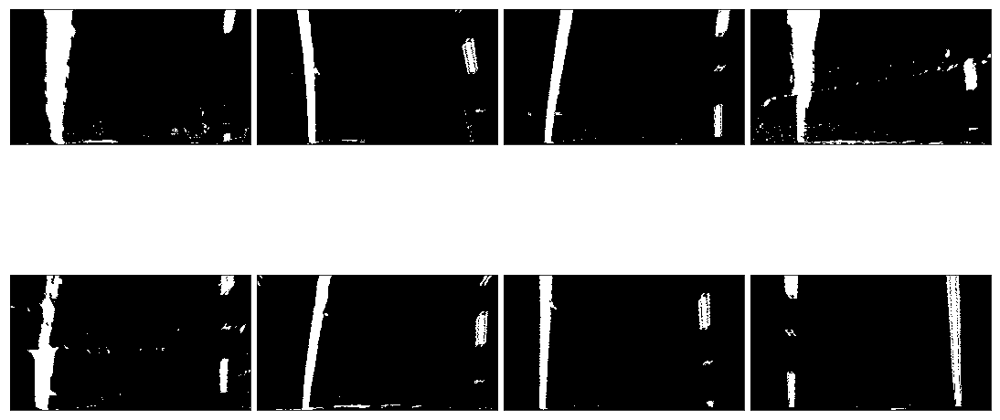

In [37]:
show_images(pipeline_test, n_row=2, n_col=4, cmap='gray')

## 7. Detect and Fit Lanes

#### Objectives : 
- Detect lane pixels and fit to find the lane boundary.

In [38]:
histograms = [np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0) for binary_warped in pipeline_test]

In [39]:
def show_plots(data_pts, n_row=2, n_col=4, figsize=(15, 6), title_name='Histogram', save=False, filename=''):

    fig, ax = plt.subplots(n_row, n_col, figsize=figsize)
    n_pts = n_row*n_col
    data_pts = data_pts[:n_pts]
    
    for i, data_pt in enumerate(data_pts):
        plt.subplot(n_row, n_col, i+1)
        plt.plot(data_pt)
        plt.title(title_name, fontsize=10)
    if save:
        plt.savefig(os.path.join(output_path, filename + '.png'))
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

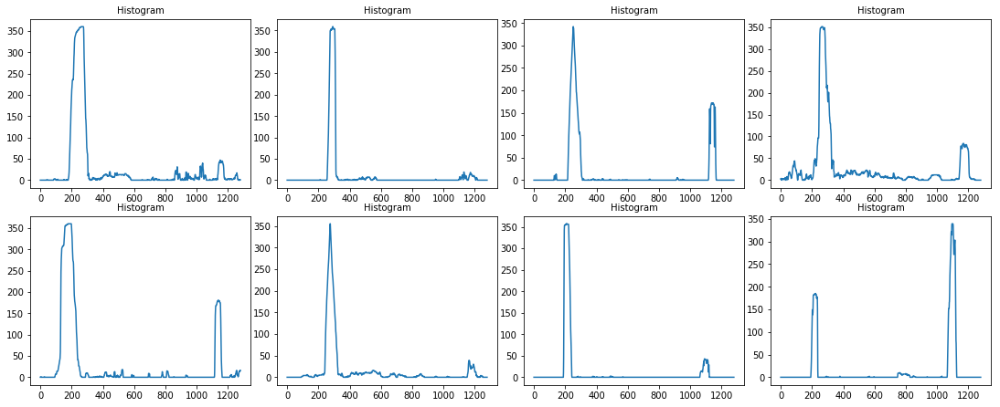

In [40]:
show_plots(histograms)

In [41]:
class LaneDetection():	
    

    def __init__(self, ImageProcessing, new_src_points=None, new_dst_points=None, new_yRange=None):
        self.IP = ImageProcessing
        self.ym_per_pix = 30/720 # meters per pixel in y dimension
        self.xm_per_pix = 3.7/700 # meters per pixel in x dimension    
        self.src_points = np.array([[205, 720], [1120, 720], [745, 480], [550, 480]], np.float32) if new_src_points is None else new_src_points # source points for the perspective transform
        self.dst_points = np.array([[205, 720], [1120, 720], [1120, 0], [205, 0]], np.float32) if new_dst_points is None else new_dst_points  # destination points for the perspective transform
        self.M = cv2.getPerspectiveTransform(self.src_points, self.dst_points)
        self.Minv = cv2.getPerspectiveTransform(self.dst_points, self.src_points)
        self.yRange = 719 if new_yRange is None else new_yRange # y range where curvature is measured
    

    def detect_lanes(self, img, nwindows = 9, margin=110, minpix=50):
        """
        Find the polynomial representation of the lines in the `image` using:
        - `nwindows` as the number of windows.
        - `margin` as the windows margin.
        - `minpix` as minimum number of pixes found to recenter the window.
        """
        # Make a binary and transform image
        processed_img = self.IP.combine_grad_color(img)
        binary_warped = self.IP.perspective_transform(processed_img, self.src_points, self.dst_points)[0]
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        
        # Fit a new second order polynomial in world space
        left_fit_curve = np.polyfit(lefty*self.ym_per_pix, leftx*self.xm_per_pix, 2)
        right_fit_curve = np.polyfit(righty*self.ym_per_pix, rightx*self.xm_per_pix, 2)

        return left_fit, right_fit, left_fit_curve, right_fit_curve, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy
    

    def plot_lanes(self, img, ax):
        """
        Visualize the windows and fitted lines for `image`.
        Returns (`left_fit` and `right_fit`)
        """
        left_fit, right_fit, left_fit_curve, right_fit_curve, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy = self.detect_lanes(img)
        # Visualization
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        ax.imshow(out_img)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
        return left_fit, right_fit, left_fit_curve, right_fit_curve
    

    def show_lanes(self, images, cols = 2, rows = 4, figsize=(15,13)):
        """
        Display `images` on a [`cols`, `rows`] subplot grid.
        Returns a collection with the image paths and the left and right polynomials.
        """
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        indexes = range(cols * rows)
        self.fits = []
        self.fits_curve = []
        for ax, idx in zip(axes.flat, indexes):
            if idx < len(images):
                image = images[idx]
                left_fit, right_fit, left_fit_curve, right_fit_curve = self.plot_lanes(image, ax)
                self.fits.append((left_fit, right_fit))
                self.fits_curve.append((left_fit_curve, right_fit_curve))
    

    def get_curvature(self, yRange, side_fit_curve):
        """
        Returns the in meters curvature of the polynomial `fit` on the y range `yRange`.
        """
        return ((1 + (2*side_fit_curve[0]*yRange*self.ym_per_pix + side_fit_curve[1])**2)**1.5) / np.absolute(2*side_fit_curve[0])

In [42]:
LD = LaneDetection(IP)

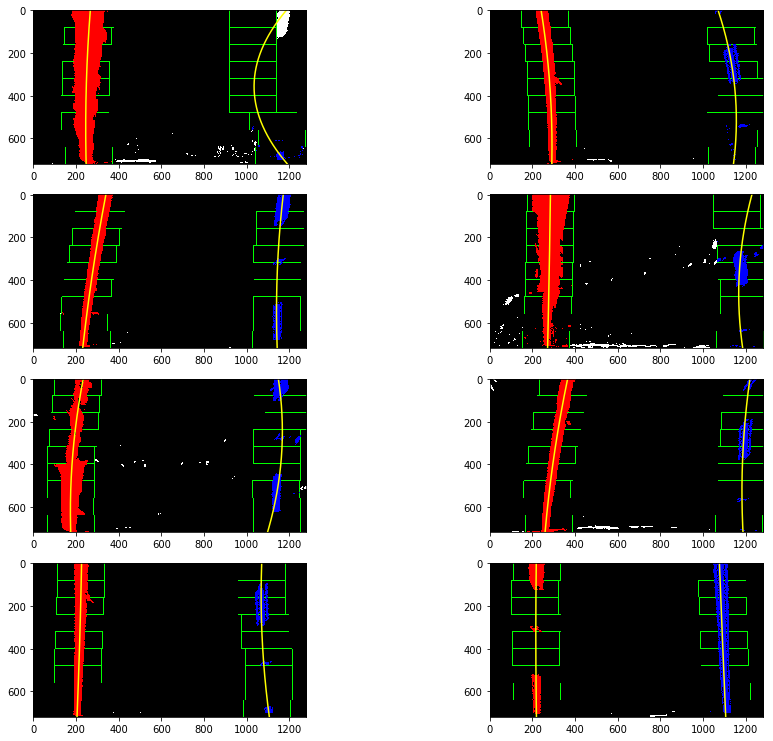

In [43]:
LD.show_lanes(sample_images_undist)

## 8. Curvature

#### Objectives : 
- Determine the curvature of the lane and vehicle position with respect to center.

In [44]:
yRange = 719

In [45]:
for fit_curve in LD.fits_curve:
    left_fit_curve, right_fit_curve = fit_curve
    left_curvature = LD.get_curvature(yRange, left_fit_curve) / 1000
    right_curvature = LD.get_curvature(yRange, right_fit_curve) / 1000
    print('Left : {:.2f} km, Right : {:.2f} km'.format(left_curvature, right_curvature))

Left : 2.30 km, Right : 0.14 km
Left : 1.30 km, Right : 0.51 km
Left : 2.98 km, Right : 1.55 km
Left : 22.15 km, Right : 0.57 km
Left : 1.05 km, Right : 0.53 km
Left : 1.97 km, Right : 1.23 km
Left : 10.94 km, Right : 1.38 km
Left : 8.31 km, Right : 45.40 km


## 9. Warp detected lanes

#### Objectives : 
- Warp the detected lane boundaries back onto the original image.

In [46]:
class Drawer():
    
    def __init__(self, LaneDetection):
        self.LD = LaneDetection

        
    def draw_line(self, img, left_fit, right_fit):
        '''
        Inputs
        img: input image
        left_fit: polynomial of left lane line
        right_fit: polynomial of right lane line
        ---
        Returns
        Draw the lane lines on the image `img` using the poly `left_fit` and `right_fit`
        '''
        yMax = img.shape[0]
        ploty = np.linspace(0, yMax - 1, yMax)
        color_warp = np.zeros_like(img).astype(np.uint8)

        # Calculate points.
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, self.LD.Minv, (img.shape[1], img.shape[0])) 
        return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

    
    def draw_lane_on_image(self, img):
        '''
        Inputs
        img: input image
        ---
        Returns
        Find and draw the lane lines on the image `img`.
        '''
        left_fit, right_fit, _, _, _, _, _, _, _ = self.LD.detect_lanes(img)
        output = self.draw_line(img, left_fit, right_fit)
        return output

In [47]:
Dr = Drawer(LD)
images_with_drawings = [Dr.draw_lane_on_image(img) for img in sample_images_undist]

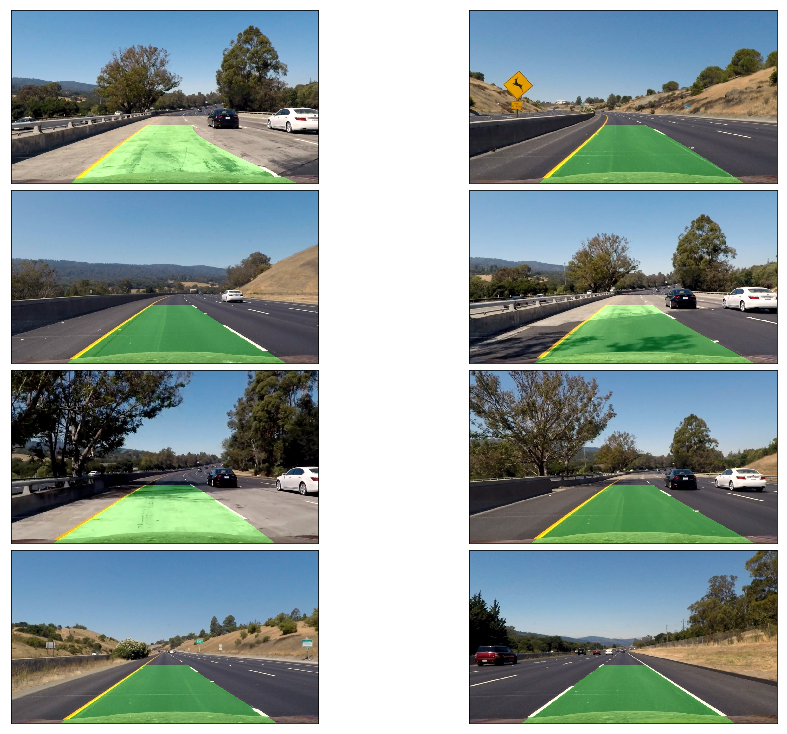

In [48]:
show_images(images_with_drawings, n_row=4, n_col=2, cmap='gray')

## 10. Output visuals and Video Pipeline

#### Objectives : 
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [49]:
def calculate_lines_info(img):
    """
    Find and draw the lane lines on the image `img`.
    """
    # Gather fits
    left_fit, right_fit, left_fit_curve, right_fit_curve, _, _, _, _, _ = LD.detect_lanes(img)
    
    # Gather curvature
    left_curvature, right_curvature = LD.get_curvature(yRange, left_fit_curve), LD.get_curvature(yRange, right_fit_curve)
    
    # Calculate vehicle center
    x_max = img.shape[1]*LD.xm_per_pix
    y_max = img.shape[0]*LD.ym_per_pix
    vehicle_center = x_max / 2
    
    # Calculate delta between vehicle center and lane center
    left_line = left_fit_curve[0]*y_max**2 + left_fit_curve[1]*y_max + left_fit_curve[2]
    right_line = right_fit_curve[0]*y_max**2 + right_fit_curve[1]*y_max + right_fit_curve[2]
    center_line = left_line + (right_line - left_line)/2
    delta_from_center = center_line - vehicle_center
    
    return [left_fit, right_fit, left_fit_curve, right_fit_curve, left_curvature, right_curvature, delta_from_center]
    
    
def display_info(img, lines_info, font = cv2.FONT_HERSHEY_SIMPLEX, font_scale=1, font_color = (255, 255, 255)):
    
    left_fit, right_fit, _, _, left_curvature, right_curvature, delta_from_center = lines_info
    
    output = Dr.draw_line(img, left_fit, right_fit)

    # Adjust message
    message = '{:.2f} m right'.format(delta_from_center) if delta_from_center > 0 else '{:.2f} m left'.format(-delta_from_center)
    
    # Add info
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(left_curvature), (50, 50), font, font_scale, font_color, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(right_curvature), (50, 120), font, font_scale, font_color, 2)
    cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, font_scale, font_color, 2)
    return output

In [50]:
def pipeline(img):
    lines_info = calculate_lines_info(img)
    return display_info(img, lines_info)

In [51]:
pipeline_output = [pipeline(img) for img in sample_images_undist]

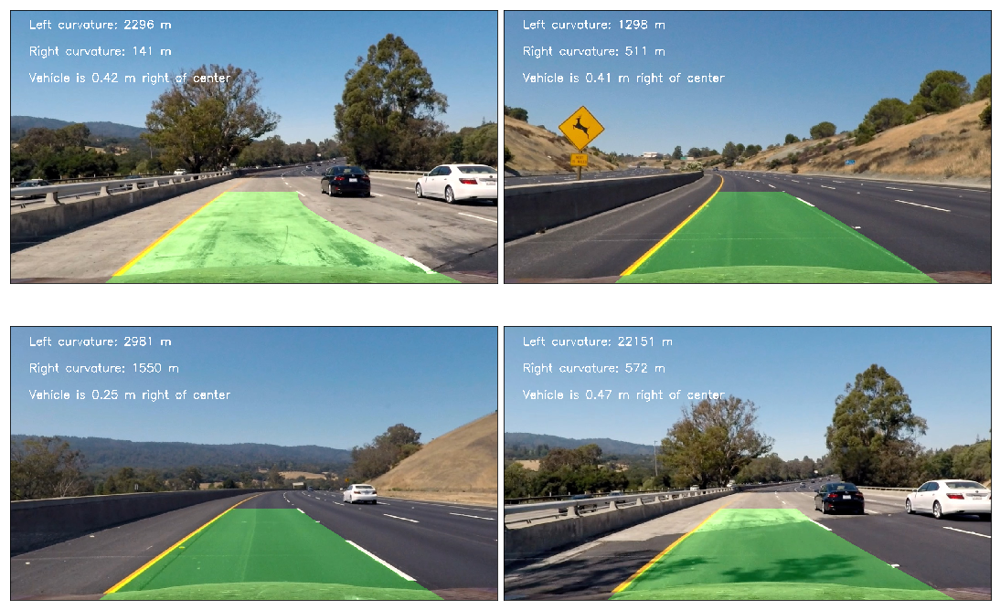

In [52]:
show_images(pipeline_output, n_row=2, n_col=2, cmap='gray')

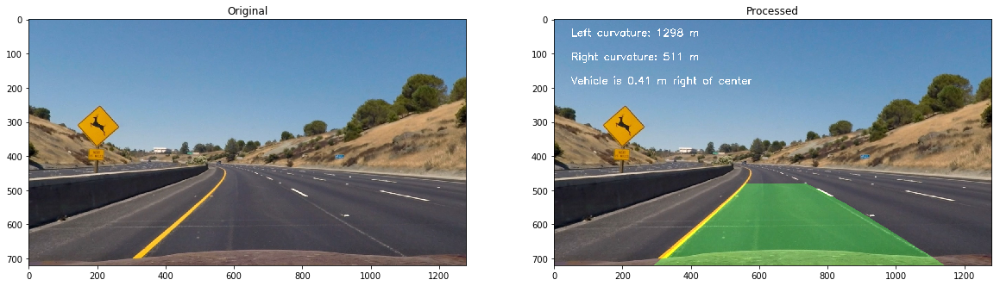

In [53]:
compare_images([sample_images_undist[1], pipeline_output[1]], ['Original', 'Processed'])

In [54]:
class Line():
    
    def __init__(self, frames_to_keep):
        # was the line detected in the last iteration?
        self.detected = False  
        
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=frames_to_keep) # []
        
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        
        # polynomial coefficients for the most recent fit in real world metrics
        self.current_fit_curve = [np.array([False])] 
        
        # radius of curvature of the line in some units
        self.radius_of_curvature = None 

        # detected line pixels
        self.lane_idx = deque(maxlen=frames_to_keep)

In [55]:
class videoPipeline():
    
    def __init__(self, frames_to_keep=10):
        
        # initialize helpers class
        self.CC = CameraCalibration(camera_path)
        self.IP = ImageProcessing()
        self.LD = LaneDetection(self.IP)
        self.Dr = Drawer(self.LD)
        
        self.left_line = Line(frames_to_keep)
        self.right_line = Line(frames_to_keep)
        
        self.current_lines_info = []
        
        # curvature info
        self.curvature = None
        self.curve_good = None
        
        # change history
        self.fit_change_hist = []
        self.curve_change_hist = []
        
        
    def calculate_lines_info(self, img):
        """
        Find and draw the lane lines on the image `img`.
        """
        # Gather fits
        left_fit, right_fit, left_fit_curve, right_fit_curve, _, _, _, _, _ = self.LD.detect_lanes(img)

        # Gather curvature
        left_curvature, right_curvature = self.LD.get_curvature(self.LD.yRange, left_fit_curve), self.LD.get_curvature(self.LD.yRange, right_fit_curve)

        # Calculate vehicle center
        x_max = img.shape[1]*self.LD.xm_per_pix
        y_max = img.shape[0]*self.LD.ym_per_pix
        vehicle_center = x_max / 2

        # Calculate delta between vehicle center and lane center
        left_line = left_fit_curve[0]*y_max**2 + left_fit_curve[1]*y_max + left_fit_curve[2]
        right_line = right_fit_curve[0]*y_max**2 + right_fit_curve[1]*y_max + right_fit_curve[2]
        center_line = left_line + (right_line - left_line)/2
        delta_from_center = center_line - vehicle_center

        return [left_fit, right_fit, left_fit_curve, right_fit_curve, left_curvature, right_curvature, delta_from_center]

    
    def display_info(self, img, lines_info, font = cv2.FONT_HERSHEY_SIMPLEX, font_scale=1, font_color = (255, 255, 255)):

        left_fit, right_fit, _, _, left_curvature, right_curvature, delta_from_center = lines_info

        output = self.Dr.draw_line(img, left_fit, right_fit)

        # Adjust message
        message = '{:.2f} m right'.format(delta_from_center) if delta_from_center > 0 else '{:.2f} m left'.format(-delta_from_center)

        # Add info
        cv2.putText(output, 'Left curvature: {:.0f} m'.format(left_curvature), (50, 50), font, font_scale, font_color, 2)
        cv2.putText(output, 'Right curvature: {:.0f} m'.format(right_curvature), (50, 120), font, font_scale, font_color, 2)
        cv2.putText(output, 'Vehicle is {} of center'.format(message), (50, 190), font, font_scale, font_color, 2)
        return output
    
    
    def static_processing(self, img):
        lines_info = self.calculate_lines_info(img)
        return self.display_info(img, lines_info)
        

    def dynamic_processing(self, img):
        
        lines_info = self.calculate_lines_info(img)
        
        left_fit, right_fit, left_fit_curve, right_fit_curve, left_curvature, right_curvature, delta_from_center = lines_info
        
        if left_curvature > 10000:
            left_fit = self.left_line.current_fit
            left_fit_curve = self.left_line.current_fit_curve
            left_curvature = self.left_line.radius_of_curvature
        else:
            self.left_line.current_fit = left_fit
            self.left_line.current_fit_curve = left_fit_curve
            self.left_line.radius_of_curvature = left_curvature
        
        if right_curvature > 10000:
            right_fit = self.right_line.current_fit
            right_fit_curve = self.right_line.current_fit_curve
            right_curvature = self.right_line.radius_of_curvature
        else:
            self.right_line.current_fit = right_fit
            self.right_line.current_fit_curve = right_fit_curve
            self.right_line.radius_of_curvature = right_curvature
        
        safe_lines_info = left_fit, right_fit, left_fit_curve, right_fit_curve, left_curvature, right_curvature, delta_from_center
        
        return self.display_info(img, safe_lines_info)

    
    def run(self, input_video, output_video):
        
        raw_clip = VideoFileClip(input_video)
        processed_clip = raw_clip.fl_image(self.dynamic_processing)
        processed_clip.write_videofile(output_video, audio=False)


In [56]:
vP = videoPipeline()

In [57]:
vP.run('challenge_video.mp4', 'challenge_video_output.mp4')

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [08:33<00:00,  1.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

